In [1]:
import numpy as np
import pydicom
import os
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

In [2]:
def load_scan(path):
    slices = [pydicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: int(x.InstanceNumber))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)
        
    for s in slices:
        s.SliceThickness = slice_thickness
        
    return slices

In [3]:
def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)
    '''
    # Set outside-of-scan pixels to 1
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0
    
    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope
    
    if slope != 1:
        image = slope * image.astype(np.float64)
        image = image.astype(np.int16)
        
    image += np.int16(intercept)
    '''
    return np.array(image, dtype=np.int16)
    

In [4]:
patient = load_scan("./Helmsley3DMIP/2012-01-17-series214")
slice1_pixel = patient[0].pixel_array

In [5]:
np.shape(slice1_pixel)

(512, 512)

In [6]:
id = 0
patient = load_scan("./Helmsley3DMIP/2012-01-17-series214")
imgs = get_pixels_hu(patient)
np.save("./" + "fullimages_%d.npy" % (id), imgs)

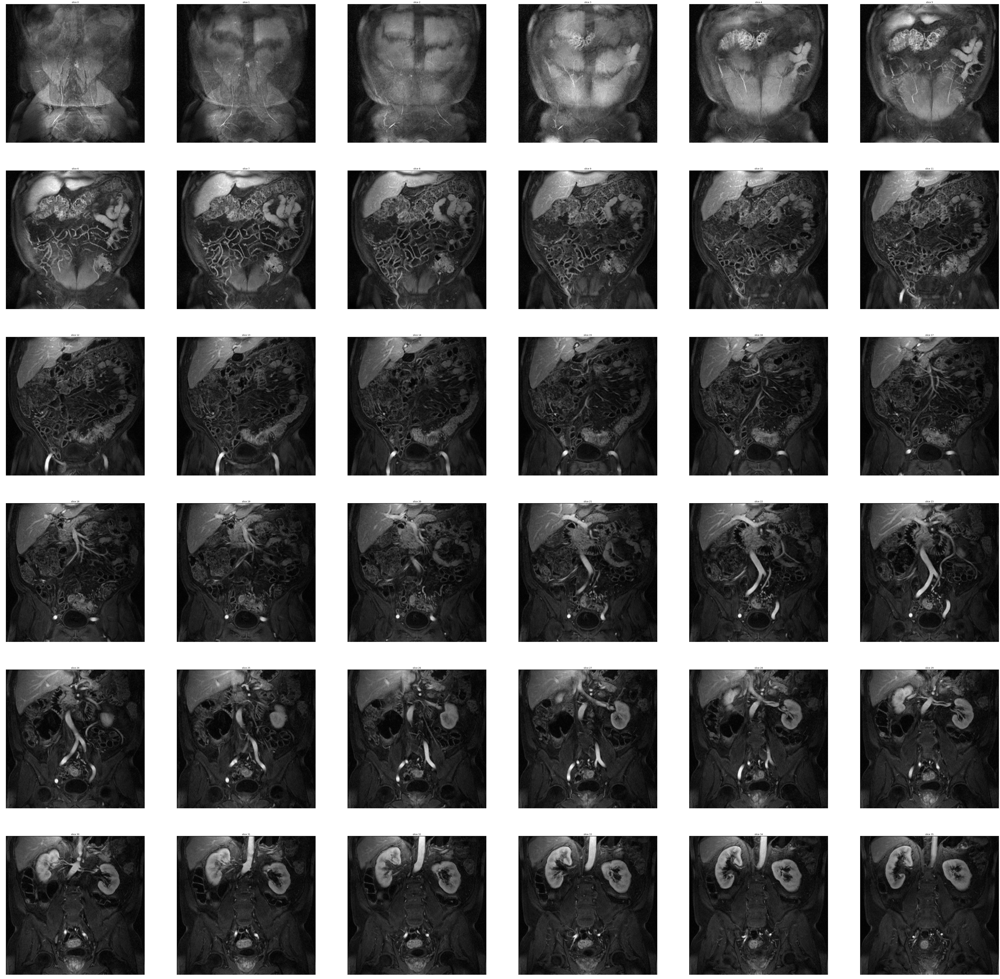

In [9]:
id = 0
imgs_to_process = np.load("./"+'fullimages_{}.npy'.format(id))

def sample_stack(stack, rows=6, cols=6, start_with=0, show_every=1):
    fig,ax = plt.subplots(rows,cols,figsize=[100,100])
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        ax[int(i/rows),int(i % rows)].imshow(stack[ind],cmap='gray')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()

sample_stack(imgs_to_process)

In [ ]:
#create model
model = Sequential()
#add model layers
model.add(Conv2D(64, kernel_size=3, activation=’relu’, input_shape=(512,512,1)))
model.add(Conv2D(32, kernel_size=3, activation=’relu’))
model.add(Flatten())
model.add(Dense(10, activation=’softmax’))

In [ ]:
#compile model using accuracy to measure model performance
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])